Importing needed libraries. For the purpose of implementation of the given algorithm we are going to use :

- Python 3
- Numpy
- OpenCV
- SciPy

In [96]:
import numpy as np
import cv2 
import matplotlib.pyplot as plt
from scipy.ndimage import generic_filter
import os

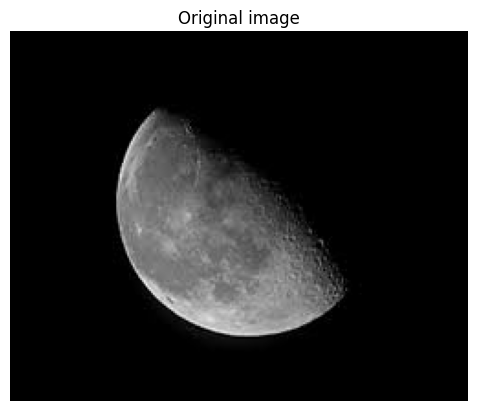

In [97]:
base_path = 'Base_images/'
img = cv2.imread(base_path + 'test.jpg', cv2.IMREAD_GRAYSCALE)

plt.imshow(img, cmap='gray')
plt.title('Original image')
plt.axis('off')
plt.show()

Salt and Pepper noise to the image for tests

In [98]:
def add_salt_pepper_noise(img, p):
    noisy = img.copy()
    rand = np.random.rand(*img.shape)
    #black part p/2
    noisy[rand < p / 2] = 0
    #white part p/2
    noisy[(rand >= p / 2) & (rand < p)] = 255
    return noisy  

def add_noise_and_save(image_paths, p=0.05):
    for path in image_paths:
        # Load image
        img = cv2.imread(path)
        if img is None:
            print(f"Failed to load {path}")
            continue
        
        # Add noise
        noisy_img = add_salt_pepper_noise(img, p)
        
        # Create output path
        dir_name, file_name = os.path.split(path)
        output_path = os.path.join(dir_name, "noisy_" + file_name)
        
        # Save image
        cv2.imwrite(output_path, noisy_img)
        print(f"Saved noisy image to {output_path}")

### What is a t-norm?

A **t-norm** (triangular norm) is a mathematical function used in fuzzy logic to model 
the meaning of the logical **AND** operation when values are not just 0 or 1, but 
any number between 0 and 1.  
It tells us how "strongly" two fuzzy values should be combined.

For example:
- In classical logic: `1 AND 0 = 0`, `1 AND 1 = 1`
- In fuzzy logic: values can be like 0.3, 0.7, 0.9, etc.
- A t-norm decides how to combine these fuzzy degrees.

A t-norm must always:
- Be **commutative** (T(x, y) = T(y, x))
- Be **associative**
- Be **increasing** in each argument
- Have **1 as a neutral element** (T(1, x) = x)

These rules make t-norms behave like a smooth and flexible version of logical AND.

---

### Why do we need t-norms?

We use t-norms when we want to combine two fuzzy values in a meaningful way.  
This happens in:
- fuzzy filters  
- fuzzy edge detection  
- fuzzy mathematical morphology  
- decision-making systems  
- image processing where pixel intensities are treated as fuzzy values  

T-norms help us express:  
**"To what degree are both conditions true?"**

---

### The four basic t-norms used in this project

#### 1. Minimum t-norm
`T_min(x, y) = min(x, y)`  
The strictest version of AND — takes the smaller value.

#### 2. Product t-norm
`T_prod(x, y) = x * y`  
Models statistical independence; smooth and continuous.

#### 3. Łukasiewicz t-norm
`T_luk(x, y) = max(x + y - 1, 0)`  
Allows compensation: a high value in one input can partially make up for a lower value in the other.

#### 4. Nilpotent minimum t-norm
`T_nilmin(x,y) = if x + y > 1 → min(x, y) else → 0`

Very sharp behavior: if the pair does not have enough "information", the result is zero.

Each t-norm gives a different way of combining fuzzy values, and this affects how the image filter behaves.

In [99]:
#Minimum t-norm: TM(x, y) = min(x, y)
def t_min(x, y):
    return min(x, y)

#Product t-norm: TP(x, y) = x * y
def t_product(x, y):
    return x * y

#Łukasiewicz t-norm: TL(x, y) = max(x + y − 1, 0)
def t_luk(x, y):
    return max(x + y - 1, 0)

#Nilpotent minimum t-norm TnM(x, y) = min(x, y)  if x + y > 1 else 0
def t_nilmin(x, y):
    return min(x,y) if x+y>1 else 0

#For the further usage
T_NORMS = {
    "min": t_min,
    "product": t_product,
    "luk": t_luk,
    "nilmin": t_nilmin
}

### What is the Lower Constructor?

The **lower constructor** is a fuzzy image processing operator.  
It works similarly to a convolution filter, but instead of using normal arithmetic, it uses **t-norms** to combine pixel values.

For a pixel at position $(x, y)$, the lower constructor:
1. Looks at a window of neighboring pixels (a fuzzy neighborhood).
2. Compares each neighbor with the central pixel using a t-norm $T_2$.
3. Combines all these comparisons using another t-norm $T_1$.
4. Produces a new pixel value.

Mathematically, this is written as:

$$
L_{n,m}^{T_1,T_2}[R](x,y)
$$

This means:
- $T_2$ measures similarity between each neighbor and the center pixel.
- $T_1$ aggregates all these similarities into one final value.


### Why do we use t-norms inside the lower constructor?

T-norms allow us to treat pixel intensities as **fuzzy membership values**.  
This creates a filter that:
- is more flexible than classical convolution  
- is more resistant to noise  
- preserves edges better  
- responds smoothly to intensity changes  

Each t-norm produces a different behavior:
- `min` → stronger noise suppression  
- `product` → smoother and more gradual filtering  
- `lukasiewicz` → compensates intensity variations  
- `nilpotent minimum` → strong edge enhancement  

---

### What does the lower constructor achieve?

Using t-norms, the lower constructor can:
- reduce noise  
- enhance contrast around edges  
- support fuzzy morphological operations  
- prepare the image for Laplacian edge detection  

It is especially useful because it mixes **local neighborhood information** with **fuzzy logic**, giving a powerful and noise-resistant filtering method.

In short:

> **The lower constructor is a fuzzy neighborhood filter that uses t-norms to combine pixel values in a more robust and flexible way than traditional methods.**


In [100]:
def lower_constructor_with_tnorms(image, T1="min", T2="min", n=1, m=1):
    # image : numpy array, grayscale (0..255)
    # T1, T2 : strings selecting t-norms from T_NORMS
    # n, m : window radius
    
    # Convert t-norm names to functions
    T1_func = T_NORMS[T1]
    T2_func = T_NORMS[T2]

    # Normalize to [0,1]
    R = image.astype(np.float32) / 255.0
    
    H, W = R.shape
    output = np.zeros_like(R)
    # Process every pixel
    for x in range(H):
        for y in range(W):
            # Collect all T2(R[x-i, y-j], R[x,y])
            results = []
            for i in range(-n, n+1):
                for j in range(-m, m+1):
                    xi = x - i
                    yj = y - j
                    # Check bounds
                    if 0 <= xi < H and 0 <= yj < W:
                        results.append(
                            T2_func(R[xi, yj], R[x, y])
                        )
            # Apply T1 sequentially across all gathered values
            value = results[0]
            for r in results[1:]:
                value = T1_func(value, r)
            output[x, y] = value
    # Convert back to 0–255
    return np.uint8(np.clip(output * 255, 0, 255))

# Laplacian in OpenCV

## 1. What the Laplacian Does

The **Laplacian operator** is a second-order derivative operator that highlights areas of rapid intensity change in an image (edges). Mathematically, for an image \(I(x, y)\):

$$
\nabla^2 I = \frac{\partial^2 I}{\partial x^2} + \frac{\partial^2 I}{\partial y^2}
$$

- $\frac{\partial^2 I}{\partial x^2}$ is the second derivative along the horizontal direction.
- $\frac{\partial^2 I}{\partial y^2}$ is the second derivative along the vertical direction.

**Intuition:**
- The Laplacian reacts to sudden changes in intensity.
- Positive values appear where intensity decreases sharply, negative values where it increases sharply.
- Uniform regions have a Laplacian close to 0.

## 2. Discrete Approximation in OpenCV

In digital images, derivatives are approximated using **convolution with a kernel**. For a 3×3 neighborhood:

\[
\begin{bmatrix}
0 & 1 & 0 \\
1 & -4 & 1 \\
0 & 1 & 0
\end{bmatrix} * I
\]

Or a version including diagonals:

\[
\begin{bmatrix}
1 & 1 & 1 \\
1 & -8 & 1 \\
1 & 1 & 1
\end{bmatrix} * I
\]

Where `*` denotes convolution. The central pixel is multiplied by -4 (or -8) and the neighbors by 1, summing the result.

---

## 3. Why `cv2.CV_64F` is Used

- Second derivatives can be **negative**.
- If we store the result in `uint8` (0–255), negative values are clipped to 0, losing information.
- Using `CV_64F` (64-bit float) preserves negative and positive values:

$$
I_{\text{lap}}(x,y) \in \mathbb{R}, \quad -\infty < I_{\text{lap}} < \infty
$$

- This ensures accuracy and retains all edge information.


---

## 4. Why `cv2.convertScaleAbs` is Needed

- To display the image, we need **8-bit positive values** (`uint8`, 0–255).
- `convertScaleAbs` does two things:
  1. Takes the absolute value: \( |I_{\text{lap}}| \)
  2. Converts to `uint8` suitable for display.

---

## 5. Why the Laplacian Uses Second Derivatives Instead of First

### First Derivative (Gradient)

$$
\frac{\partial I}{\partial x}, \quad \frac{\partial I}{\partial y}
$$

- Shows **rate of change of intensity**.
- Used in Sobel or Scharr operators.
- Sensitive to noise.
- Provides **direction of change**, not the exact boundary location.

### Second Derivative (Laplacian)

$$
\frac{\partial^2 I}{\partial x^2} + \frac{\partial^2 I}{\partial y^2}
$$

- Shows **change in the rate of change** of intensity.
- Detects points where intensity transitions sharply → precise edge detection.
- Zero on flat regions, positive/negative at boundaries.
- Orientation-independent (doesn’t matter which way the edge runs).


### Example 1D Signal
[0 0 0 10 10 10]
- **First derivative:** `[0, 0, 10, 0, 0]` → shows intensity increase but not end of edge.  
- **Second derivative:** `[0, 0, 10, -10, 0, 0]` → clearly shows where edge starts and ends.

**Intuition:**
- First derivative = slope (where intensity increases/decreases)  
- Second derivative = change of slope (where edges are)  

---

## 6. Summary for Explanation

> The Laplacian computes second derivatives of an image to detect sharp intensity changes (edges). `CV_64F` preserves negative values and accuracy, while `convertScaleAbs` converts the result to a visible 8-bit image (0–255) by taking the absolute value.


PIPELINE of Classic Lower Contructor with Laplacian Operator :

Edge detection pipeline using:
1) lower constructor with t-norms
2) Laplacian operator

    Returns:
        filtered   : after lower constructor
        laplacian  : final edge map (white edges on black background)

In [101]:
def fuzzy_edge_detection_pipeline(
    image,
    T1="min",
    T2="min",
    n=1,
    m=1,
):
    # -------------------------------------
    # Step 1 — Apply fuzzy lower constructor
    # -------------------------------------
    filtered = lower_constructor_with_tnorms(
        image, T1=T1, T2=T2, n=n, m=m
    )
    # -------------------------------------
    # Step 2 — Apply Laplacian operator
    # -------------------------------------
    lap = cv2.Laplacian(filtered, cv2.CV_64F)
    lap = cv2.convertScaleAbs(lap)  # convert to 0–255 grayscale
    
    return filtered, lap

## Function to Visualize three pictures with edges being added as red overlay 


In [102]:
def visualize_pipeline_three(image_paths, pipeline_func, T1="min", T2="min", n=1, m=1, edge_threshold=30):
    """
    Visualize original image, lower constructor result, and Laplacian edge result.
    
    Parameters:
        image_paths : list of str
            List of paths to images.
        pipeline_func : function
            Function that takes (image, T1, T2, n, m) and returns (lower_constructor, laplacian)
        T1, T2 : str
            Names of t-norms for lower constructor.
        n, m : int
            Window radii for lower constructor.
        edge_threshold : int
            Threshold for detecting edges in Laplacian result.
    """
    for path in image_paths:
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            print(f"Failed to load {path}")
            continue

        # Apply pipeline
        lower_result, lap_result = pipeline_func(img, T1=T1, T2=T2, n=n, m=m)

        # --- Convert original to color (for red edges) ---
        img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

        # --- Threshold edges (white pixels = edges) ---
        _, edges = cv2.threshold(lap_result, edge_threshold, 255, cv2.THRESH_BINARY)

        # --- Paint edges red ---
        # edges > 0 → red = (0, 0, 255)
        red_overlay = img_color.copy()
        red_overlay[edges > 0] = (0, 0, 255)

        # --- Plot all 4 images ---
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        fig.suptitle(path, fontsize=14)

        axes[0].imshow(img, cmap='gray')
        axes[0].set_title("Original")
        axes[0].axis('off')

        axes[1].imshow(lower_result, cmap='gray')
        axes[1].set_title("Lower Constructor")
        axes[1].axis('off')

        axes[2].imshow(lap_result, cmap='gray')
        axes[2].set_title("Laplacian Edges")
        axes[2].axis('off')

        axes[3].imshow(red_overlay[..., ::-1])  # BGR → RGB
        axes[3].set_title("Edges (red overlay)")
        axes[3].axis('off')

        plt.show()


Application with non-optimized solution

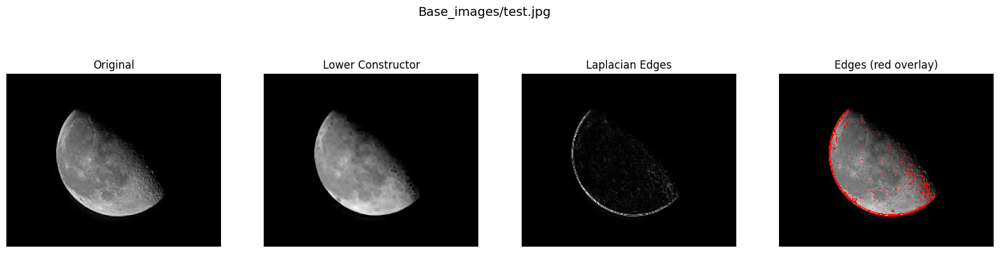

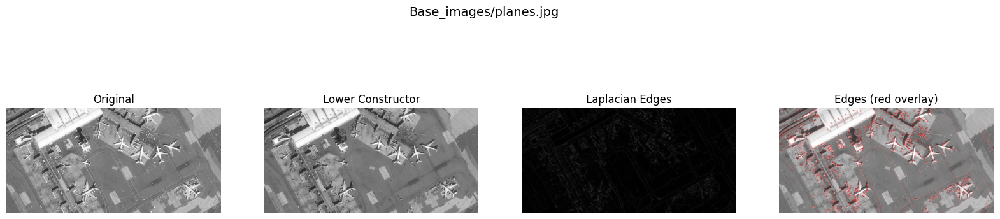

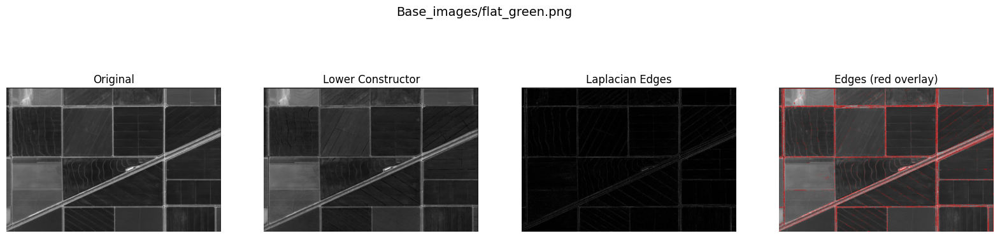

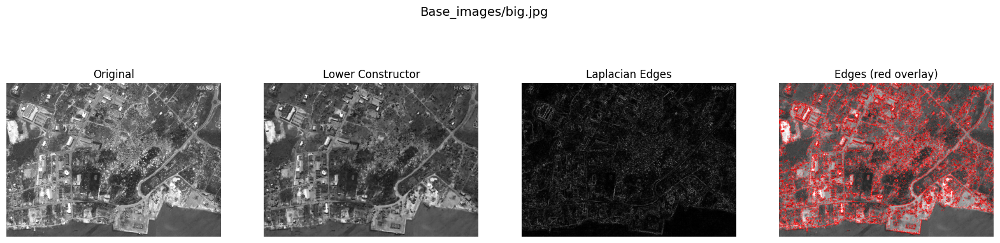

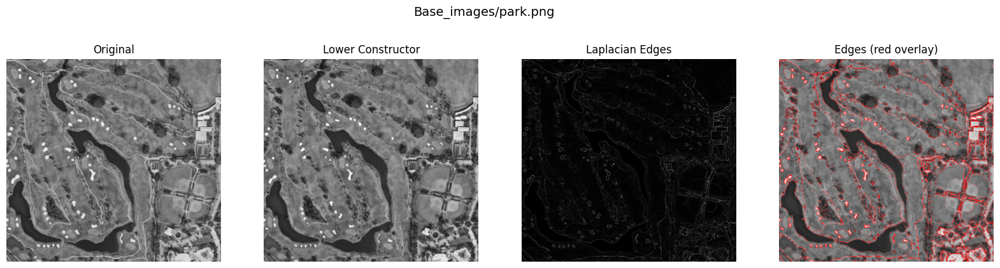

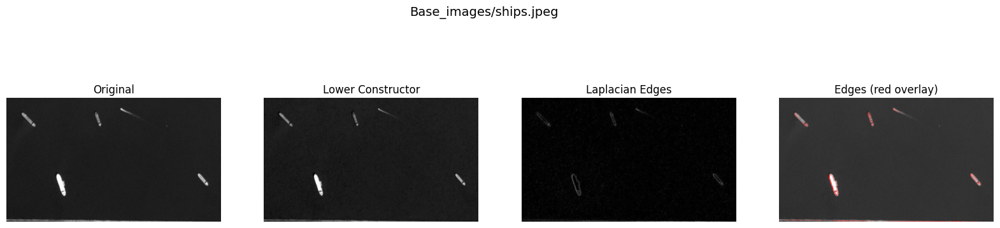

In [103]:
# List of paths
image_paths = [
    base_path + "test.jpg",
    base_path + 'planes.jpg',
    base_path + 'flat_green.png',
    base_path + 'big.jpg',
    base_path + 'park.png',
    base_path + 'ships.jpeg'
]

visualize_pipeline_three(image_paths, fuzzy_edge_detection_pipeline, T1="min", T2="min")

Optimization of the initial pipeline and Lower Constructor function 

In [104]:
def lower_constructor_optimized(image, T1="min", T2="min", n=1, m=1):
    R = image.astype(np.float32) / 255.0
    H, W = R.shape
    
    T1_func = T_NORMS[T1]
    T2_func = T_NORMS[T2]

    # Function to apply to each window
    def filter_func(window):
        center = window[len(window)//2]  # central pixel
        # Apply T2 between center and all pixels in window
        t2_values = np.array([T2_func(p, center) for p in window])
        # Aggregate with T1
        value = t2_values[0]
        for v in t2_values[1:]:
            value = T1_func(value, v)
        return value

    size = (2*n+1) * (2*m+1)
    output = generic_filter(R, filter_func, size=(2*n+1, 2*m+1), mode='nearest')
    
    return np.uint8(np.clip(output * 255, 0, 255))


# New Optimized Pipeline
def fuzzy_edge_detection_pipeline_optimized(image, T1="min", T2="min", n=1, m=1):
    # Step 1 — Apply optimized fuzzy lower constructor
    filtered = lower_constructor_optimized(image, T1=T1, T2=T2, n=n, m=m)

    # Step 2 — Apply Laplacian operator
    lap = cv2.Laplacian(filtered, cv2.CV_64F)
    lap = cv2.convertScaleAbs(lap)  # convert to 0–255 grayscale

    return filtered, lap

Now, we are going to add Salt and Pepper noise to the images to see the results of applying this algorithm with noise

Saved noisy image to Base_images\noisy_test.jpg
Saved noisy image to Base_images\noisy_planes.jpg
Saved noisy image to Base_images\noisy_flat_green.png
Saved noisy image to Base_images\noisy_big.jpg
Saved noisy image to Base_images\noisy_park.png
Saved noisy image to Base_images\noisy_ships.jpeg


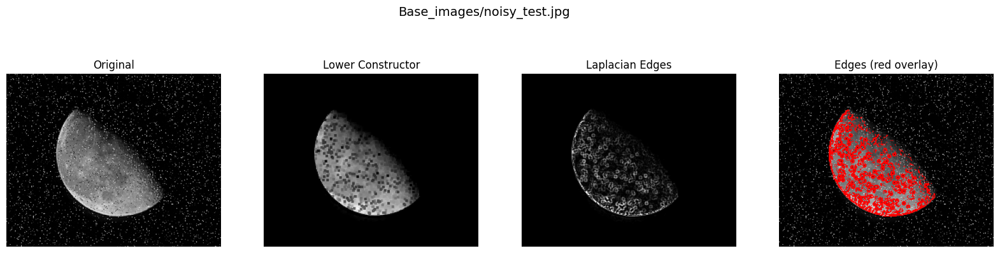

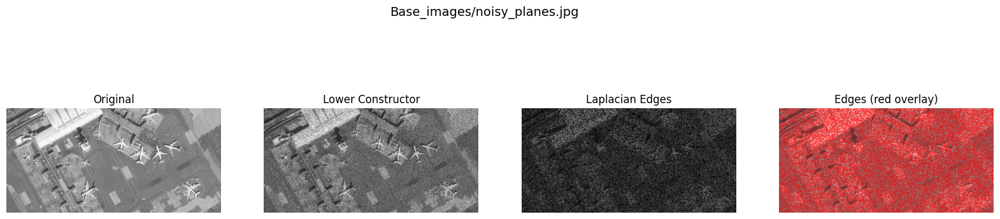

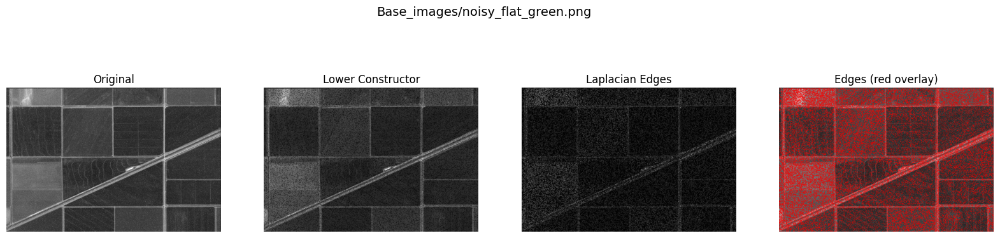

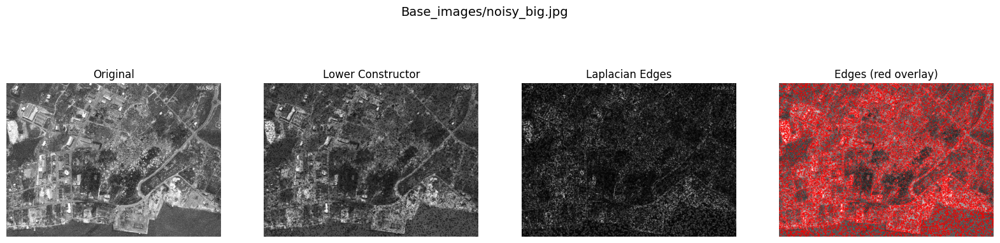

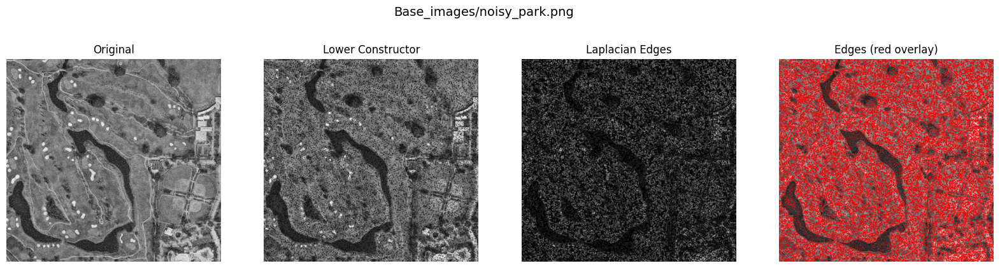

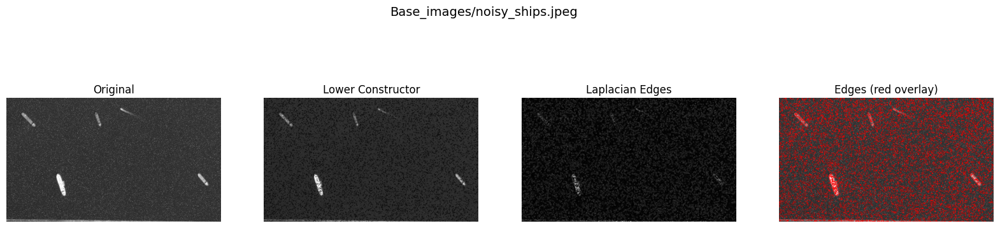

In [105]:
# List of paths
image_paths_noisy = [
    base_path + "noisy_test.jpg",
    base_path + 'noisy_planes.jpg',
    base_path + 'noisy_flat_green.png',
    base_path + 'noisy_big.jpg',
    base_path + 'noisy_park.png',
    base_path + 'noisy_ships.jpeg'
]

add_noise_and_save(image_paths, p=0.05)

visualize_pipeline_three(image_paths_noisy, fuzzy_edge_detection_pipeline_optimized, T1="min", T2="min")

## Why T1="min" and T2="nilmin" (also T1="min" and T2="luk") Works Well on Salt-and-Pepper Noisy Images

The combination of minimum (min) for aggregation (T1) and nilpotent minimum (nilmin) for pairwise operations (T2) excels in handling impulsive noise like salt-and-pepper due to nilmin's built-in threshold mechanism:

- **Selective Noise Rejection**: Nilmin applies `min(x, y)` only if `x + y > 1` (normalized [0,1] scale); otherwise, it outputs 0. This discards "incompatible" pairs, effectively suppressing isolated extremes:
  - Pepper noise (low values ~0) forces outputs to 0, flattening dark noisy areas.
  - Salt noise (high values ~1) is ignored in low-intensity regions, preventing false bright specks from propagating.
  - In bright areas, it preserves strong signals while zeroing mismatches, enhancing true edges.

- **Balanced Smoothing**: Min aggregation then takes the lowest viable value from these selective pairs, maintaining edge strength without over-darkening. This creates uniform low-intensity backgrounds (common in satellite images), reducing noise-induced gradients that the Laplacian would otherwise detect as false edges.

## Comparison to Other Combinations

- **Min-Min**: Equivalent to fuzzy erosion, it removes bright impulses (salt) well but expands dark ones (pepper), leaving residual variability in low areas. Result: More scattered false edges in the Laplacian output.

- **Product-Product**: Multiplicative decay aggressively darkens the image, suppressing noise but eroding fine details and contrasts. Result: Weaker or lost true edges, with over-smoothed Laplacian results.

Overall, min-nilmin provides robust noise suppression with better edge preservation.

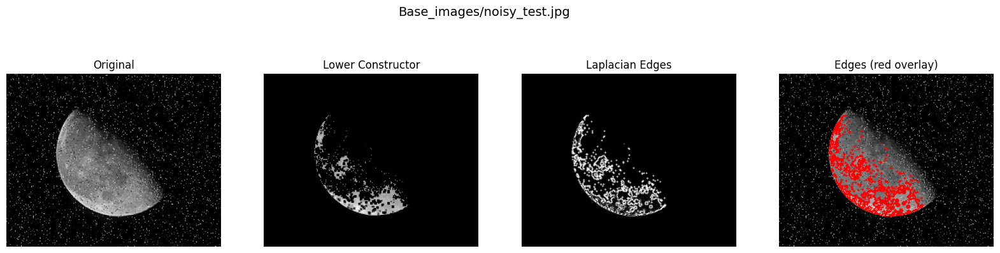

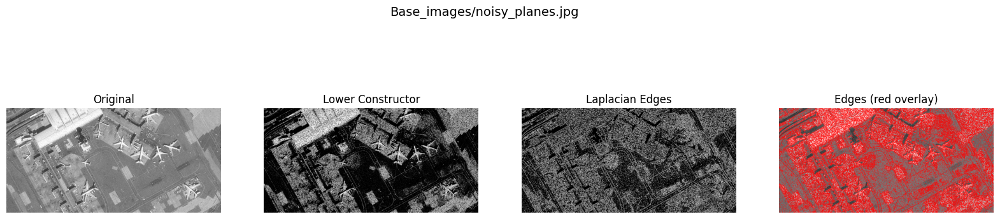

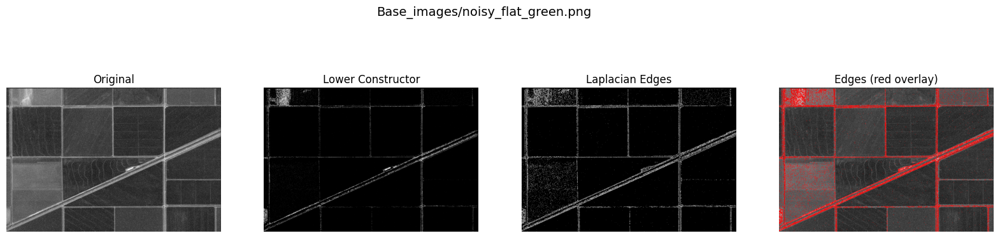

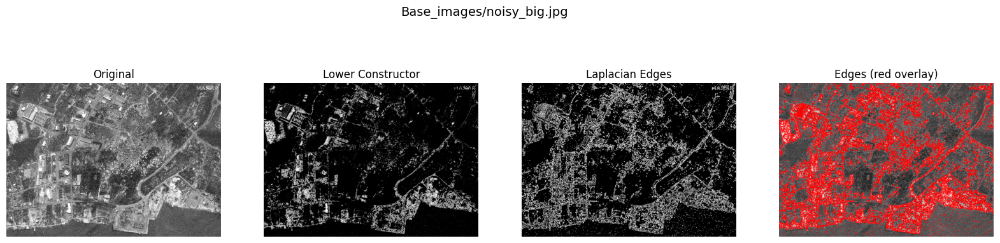

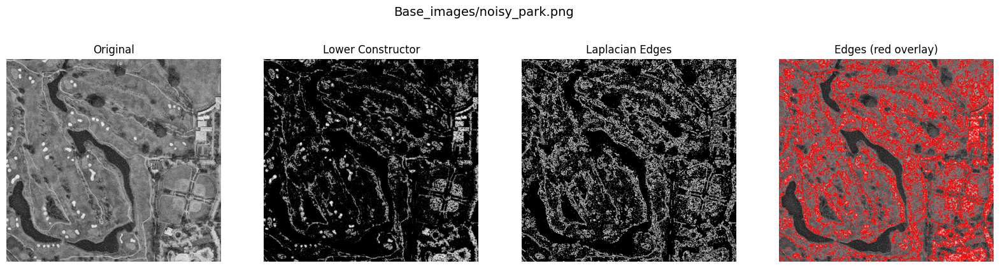

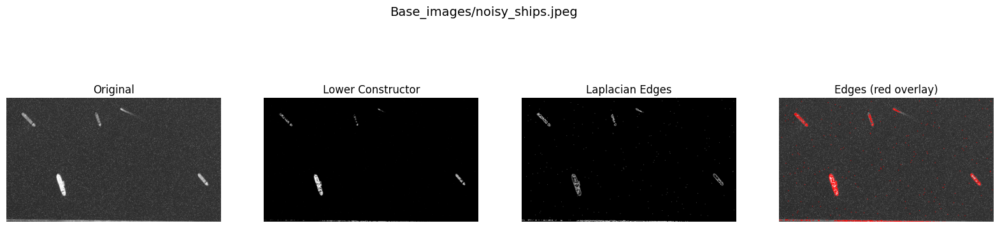

In [106]:
visualize_pipeline_three(image_paths_noisy, fuzzy_edge_detection_pipeline_optimized, T1="min", T2="nilmin")

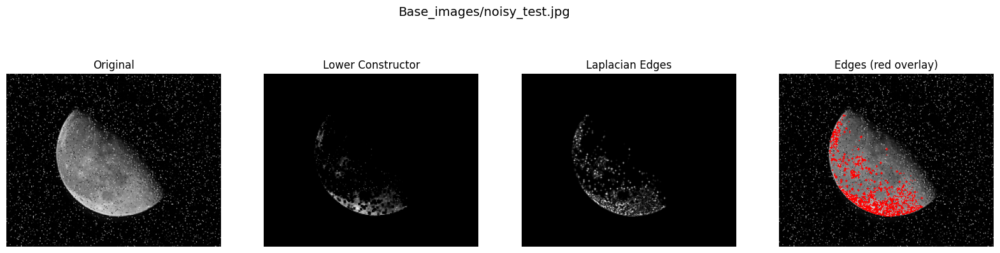

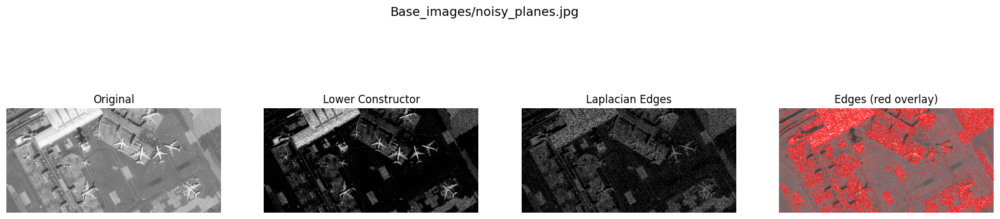

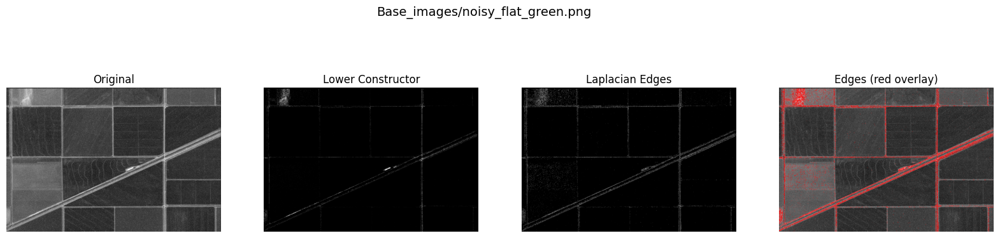

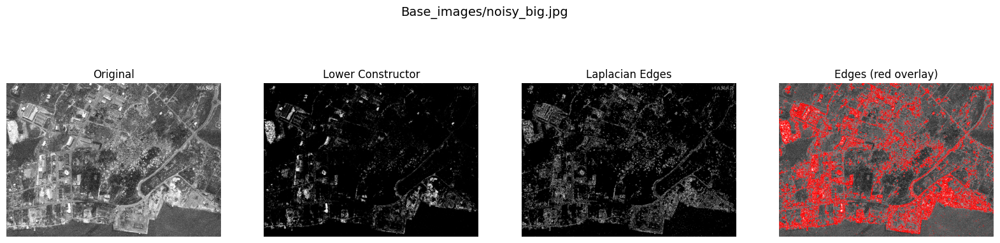

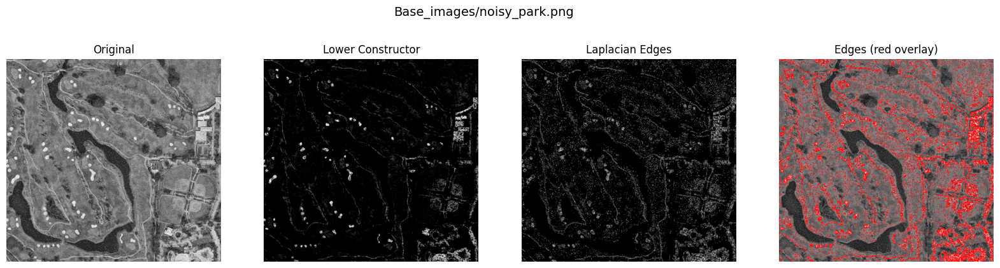

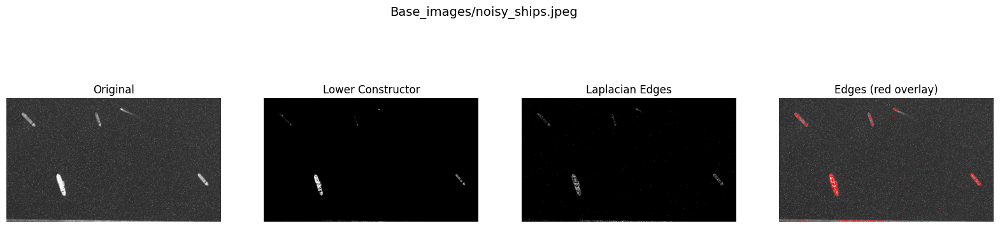

In [107]:
visualize_pipeline_three(image_paths_noisy, fuzzy_edge_detection_pipeline_optimized, T1="min", T2="luk")